In [1]:
import os
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np
import pandas as pd
import math
from tqdm import tqdm
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.decomposition import PCA
from rembg import remove

In [2]:
def resize_image(image, target_size):

    original_height, original_width, _ = image.shape
    target_width, target_height = target_size
    resized_image = np.zeros((target_height, target_width, 3), dtype=np.uint8)
    
    for i in range(target_height):
        for j in range(target_width):
            original_x = int(j * original_width / target_width)
            original_y = int(i * original_height / target_height)
            resized_image[i, j] = image[original_y, original_x]
    
    return resized_image

In [3]:
def insertGambar(folder):
    data = []
    filenames = []
    datalabel = [] 
    path = []
    data_distribution = {}
    for label in (os.listdir(folder)):
        images = os.listdir(folder+label)
        data_distribution[label] = len(images)
        datalabel.append(label)
        print(label)
        for filename in tqdm(os.listdir(folder+label)):
            img = cv.imread(os.path.join(folder+label,filename))
            if img is not None:
                img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
                img = resize_image(img, (350, 350))
                filenames.append(filename)
                path.append(label)
                data.append(img)
    return data, filenames, datalabel, path , data_distribution

In [4]:
data, filenames,label, path, distribusi = insertGambar("selected_flower/") 
print("Data: ", len(data))
print("Label: ", len(label))
print("Filenames: ", len(filenames))
print("Data Distribution: ", distribusi)

Dendellion


100%|██████████| 100/100 [00:12<00:00,  7.84it/s]


Rose


100%|██████████| 100/100 [00:11<00:00,  8.36it/s]


Sunflower


100%|██████████| 100/100 [00:13<00:00,  7.67it/s]

Data:  300
Label:  3
Filenames:  300
Data Distribution:  {'Dendellion': 100, 'Rose': 100, 'Sunflower': 100}


In [5]:
def displayImg(row, column, data):
    fig = plt.figure(figsize=(20, 20))
    for i in range(1, row*column +1):
        fig.add_subplot(row, column, i)
        plt.imshow(data[i-1], cmap='gray')
    plt.show()

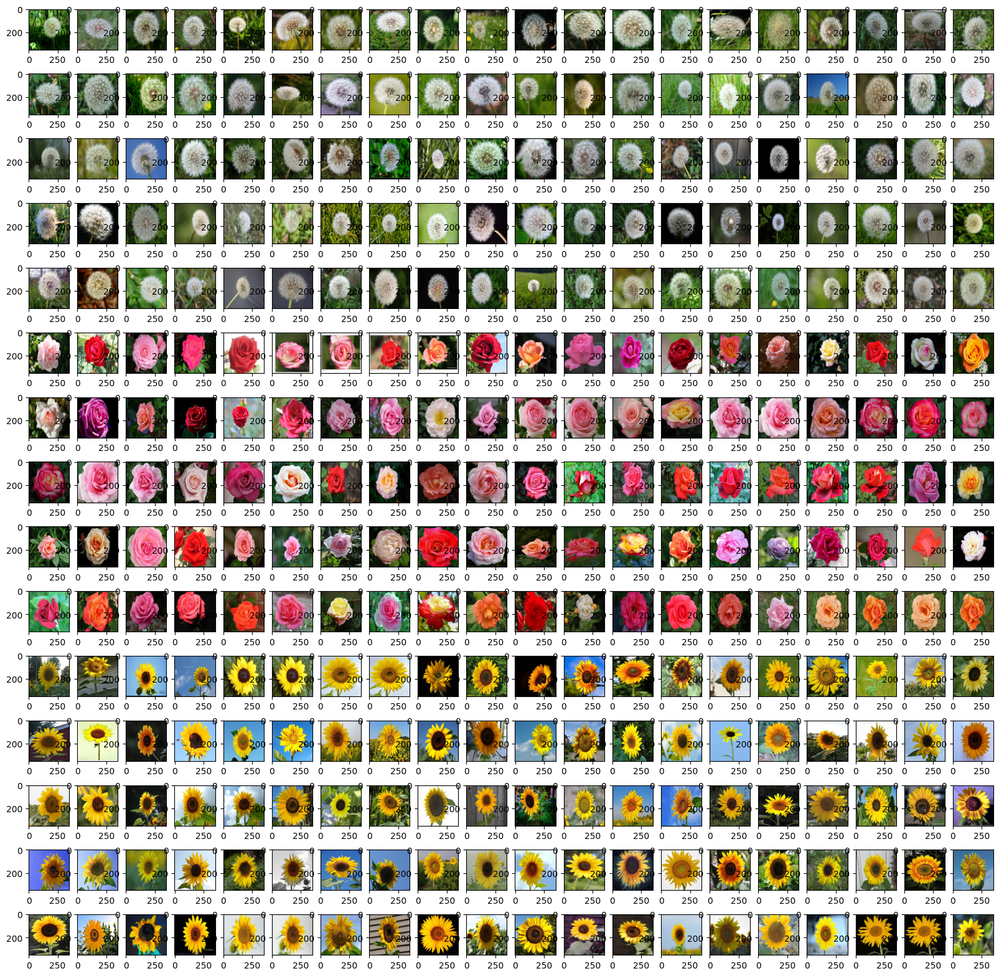

In [6]:
displayImg(15, 20, data)

In [7]:
def removeBackground(data):
    removed_data = []
    for i in tqdm(range(len(data))):
        removed_data.append(remove(data[i]))
    return removed_data

100%|██████████| 300/300 [12:54<00:00,  2.58s/it]


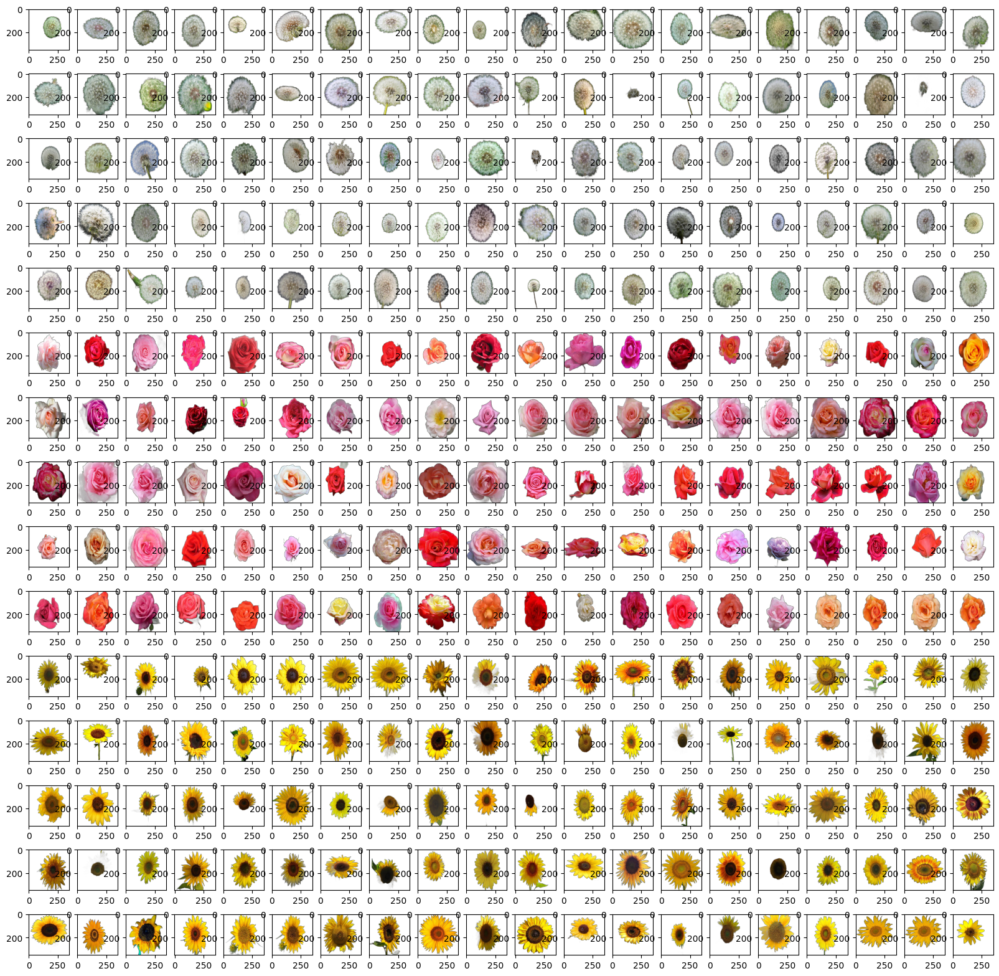

In [8]:
removed = removeBackground(data)
displayImg(15, 20, removed)

In [9]:
def grayScaling(img):
    gaussKernel = np.ones((3,3))/9
    r = img[:,:,2]
    g = img[:,:,1]
    b = img[:,:,0]
    filteredR = cv.filter2D(r,-1,gaussKernel)
    filteredG = cv.filter2D(g,-1,gaussKernel)
    filteredB = cv.filter2D(b,-1,gaussKernel)
    return np.round(filteredR/3 + filteredG/3 + filteredB/3).astype(np.uint8)

def grayScalingData(data):
    gray_data = []
    for i in tqdm(range(len(data))):
        gray_data.append(grayScaling(data[i]))
    return gray_data

100%|██████████| 300/300 [00:00<00:00, 383.41it/s]


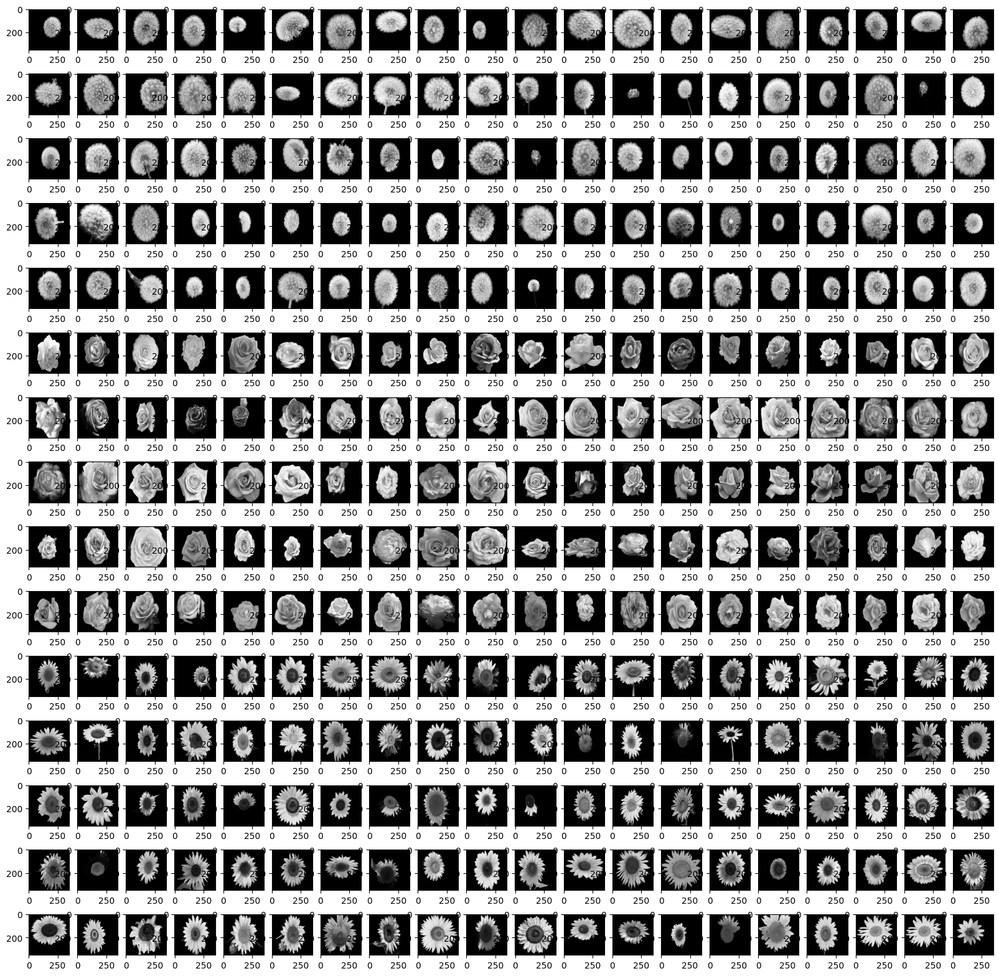

In [10]:
grayData = grayScalingData(removed)
displayImg(15, 20, grayData)

In [11]:
def addPadd(image, kernel):
   i = (kernel.shape[1]-1)//2
   j = (kernel.shape[0]-1)//2
   left = i
   right = (kernel.shape[1]-1)-i
   top = j
   bottom = (kernel.shape[0]-1)-j
   results = np.pad(image, ((top, bottom),(left, right)),mode='edge')
   return results

def sortArray(filter):
   for i in range(len(filter)-1):
      for j in range(i+1,len(filter)):
         if filter[i] > filter[j]:
            temp = filter[i]
            filter[i] = filter[j]
            filter[j] = temp
   return filter

def findMedian(filter):
    sorted = sortArray(filter)
    length = len(filter)
    if length % 2 == 0:
        x1 = (length + 1) // 2
        x2 = x1 + 1
        value = (sorted[x1-1] + sorted[x2-1]) / 2
        return value
    else:
        value = (length + 1) // 2
        return sorted[value-1]
    
def medianFiltering(image, kernel):
    result = np.zeros([image.shape[0], image.shape[1]]).astype(np.uint8)
    paddingImage = addPadd(image, kernel)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            temp = []
            if (paddingImage[i, j] == 0):
                result[i][j] = paddingImage[i, j]
                continue
            for k in range(kernel.shape[0]):
                for l in range(kernel.shape[1]):
                    temp += [paddingImage[i+k, j+l]]
            value = findMedian(temp)
            result[i][j] = value
    return result

def medianFilterData(data):
    kernel = np.ones((3, 3))
    median_data = []
    for i in tqdm(range(len(data))):
        median_data.append(medianFiltering(data[i], kernel))
    return median_data

100%|██████████| 300/300 [03:33<00:00,  1.40it/s]


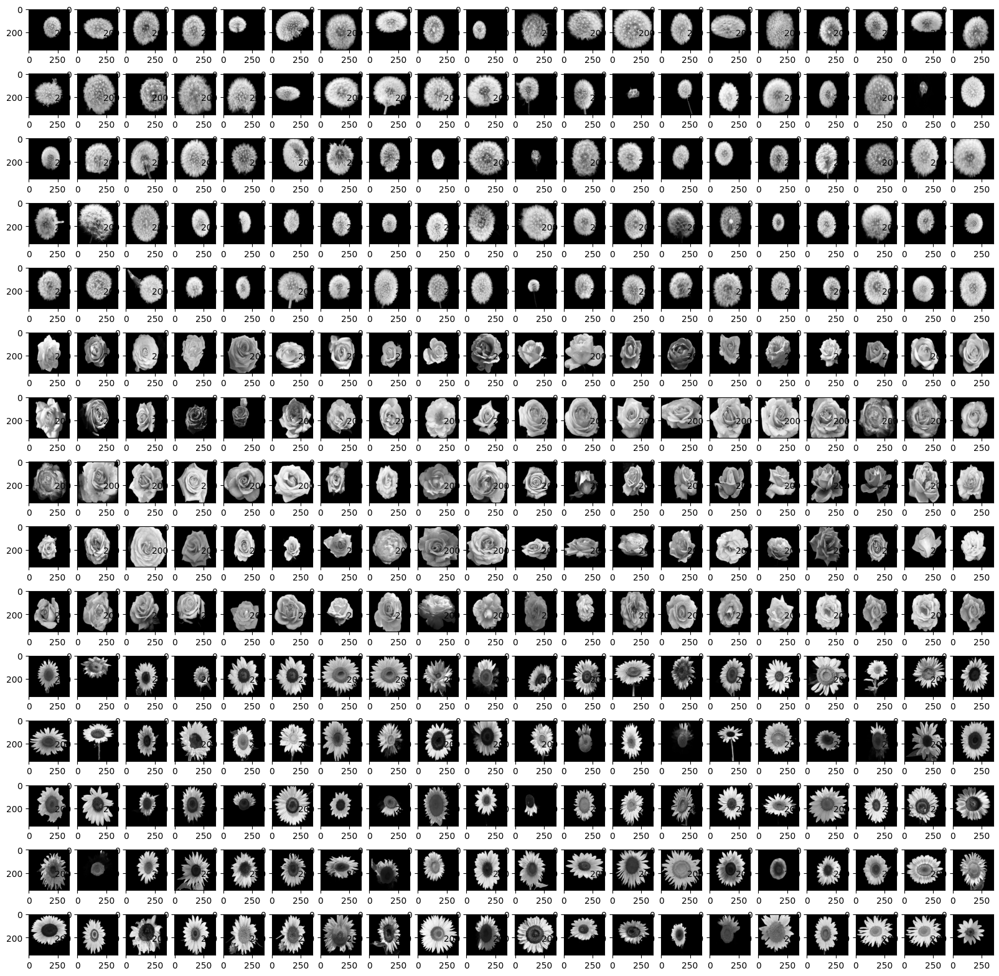

In [12]:
medianData = medianFilterData(grayData)
displayImg(15, 20, medianData)

In [13]:
def findPixel(img,skala=256):
    pixel = np.zeros(skala)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            pixel[int(img[i,j])] =  pixel[int(img[i,j])] + 1
    return pixel

def findProbability(img, pixel,skala=256):
    for i in range(skala):
        pixel[i] = pixel [i] / (img.shape[0] * img.shape[1])
    return pixel

def findCumulative(arr,skala=256):
    for i in range(skala):
        if i != 0:
            arr[i] = arr[i] + arr[i-1]
    return arr

def equalization(img):
    pixel = findPixel(img)
    pixel = findProbability(img,pixel)
    pixel = findCumulative(pixel)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            img[i,j] = pixel[int(img[i,j])] * 255
    return img

def equalizationData(data):
    equalized_data = []
    for i in tqdm(range(len(data))):
        equalized_data.append(equalization(data[i]))
    return equalized_data

100%|██████████| 300/300 [00:48<00:00,  6.20it/s]


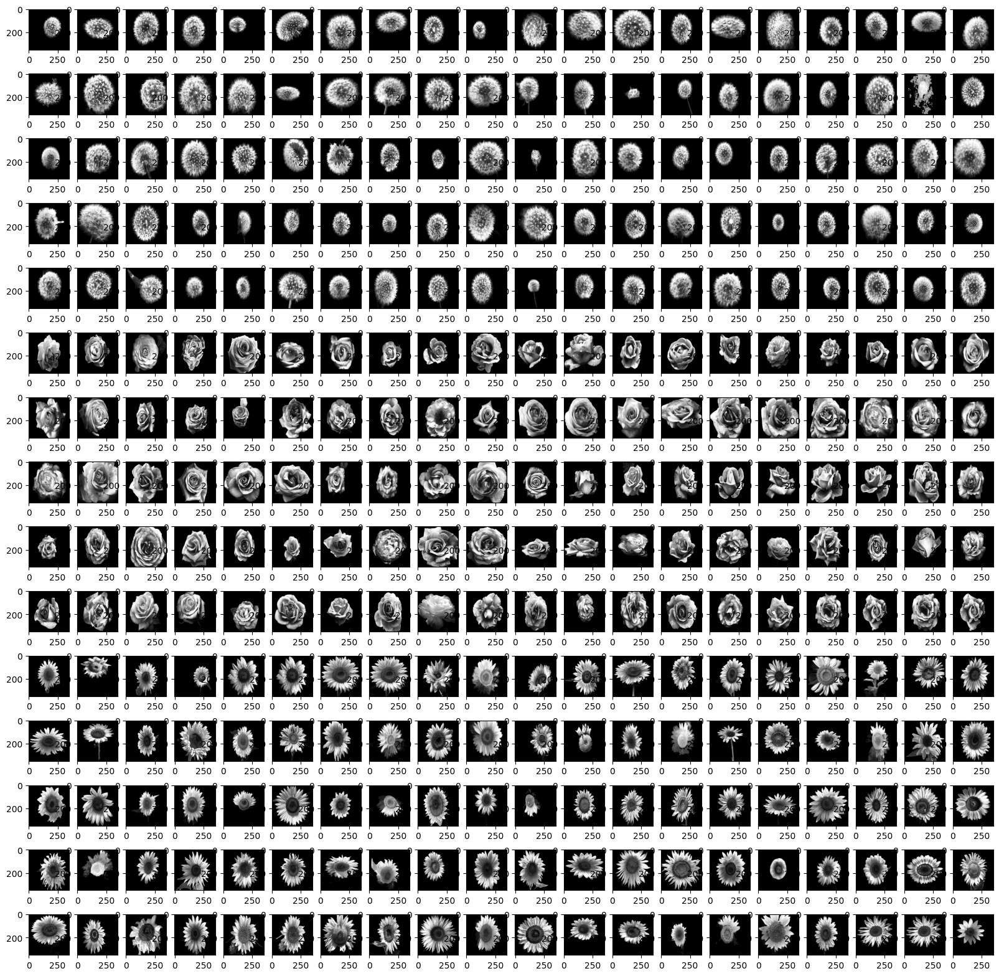

In [14]:
ekualData = equalizationData(medianData)
displayImg(15, 20, ekualData)

In [15]:
def matriksTransformasi(matriks):
    hasil = np.zeros(matriks.shape)
    for i in range(matriks.shape[0]):
        for j in range(matriks.shape[1]):
            hasil[i][j] = matriks[j][i]
    return hasil
def sum(matriks):
    hasil = 0
    for i in range(len(matriks)):
        for j in range(len(matriks[0])):
            hasil += matriks[i][j]
    return hasil

def derajat(img, derajat):
    max = np.max(img)
    temp=np.zeros([max+1,max+1])
    if derajat == 0:
        for i in range (len(img)):
            for j in range (len(img[0])-1):
                temp[img[i,j],img[i,j+1]] += 1
    elif derajat == 45:
        for i in range (len (img)-1):
            for j in range (len (img[0])-1):
                temp[img[i+1,j],img[i,j+1]] += 1
    elif derajat == 90:
        for i in range (len (img)-1):
            for j in range (len (img[0])):
                temp[img[i+1,j],img[i,j]] += 1
    elif derajat == 135:
        for i in range (len (img)-1):
            for j in range (len (img[0])-1):
                temp[img[i,j],img[i+1,j+1]] += 1
    hasil = temp+matriksTransformasi(temp)
    total = sum(hasil)
    for i in range (len (hasil)):
        for j in range (len (hasil)):
            hasil[i,j]/=total
    return hasil

def ekstraksi(image):
    hasil = []
    for img in tqdm(image):
        data = []
        data.append(derajat(img,0))
        data.append(derajat(img,45))
        data.append(derajat(img,90))
        data.append(derajat(img,135))
        hasil.append(data)    
    return hasil

In [16]:
ekstraksiData = ekstraksi(ekualData)

100%|██████████| 300/300 [03:09<00:00,  1.59it/s]


In [17]:
def contrast (data):
    hasil = 0
    for i in range(len(data)):
        for j in range(len(data[0])):
            hasil+=data[i,j]*pow(i-j,2)
    return hasil
def dissimilarity(data):  
    hasil = 0
    for i in range(len(data)):
        for j in range(len(data[0])):
            hasil+=data[i,j]*abs(i-j)
    return hasil
def homogeneity(data):
    hasil = 0
    for i in range(len(data)):
        for j in range(len(data[0])):
            hasil+=(data[i,j]/(1+pow(i-j,2)))
    return hasil
def energy(data):
    hasil = 0
    for i in range(len(data)):
        for j in range(len(data[0])):
            hasil += data[i][j] ** 2
    return hasil

def correlation(data):
    mean_x = 0
    mean_y = 0
    std_x = 0
    std_y = 0
    for i in range(len(data)):
        for j in range(len(data[0])):
            mean_x += i * data[i][j]
            mean_y += j * data[i][j]
    for i in range(len(data)):
        for j in range(len(data[0])):
            std_x += (i - mean_x) ** 2 * data[i][j]
            std_y += (j - mean_y) ** 2 * data[i][j]
    std_x = math.sqrt(std_x)
    std_y = math.sqrt(std_y)
    hasil = 0
    for i in range(len(data)):
        for j in range(len(data[0])):
            hasil += (i - mean_x) * (j - mean_y) * data[i][j]
    hasil /= std_x * std_y
    return hasil

def entropy(data):
    entropy = 0
    for i in range(len(data)):
        for j in range(len(data[0])):
            if data[i][j] > 0.0:
                entropy += -(data[i][j] * math.log(data[i][j]))
    return entropy
def asm(data):
    asm = 0
    for i in range(len(data)):
        for j in range(len(data[0])):
            asm += data[i][j] ** 2
    return asm

In [18]:
def ekstraksiFitur(data, path):
    hasil = []
    batas_gambar = len(data)
    for i in tqdm(range(batas_gambar)):
        extracted_data = [path[i]]
        for j in range(len(data[i])):
            contrast_val = contrast(data[i][j])
            extracted_data.append(contrast_val)
        for j in range(len(data[i])):
            dissimilarity_val = dissimilarity(data[i][j])
            extracted_data.append(dissimilarity_val)
        for j in range(len(data[i])):
            homogeneity_val = homogeneity(data[i][j])
            extracted_data.append(homogeneity_val)
        for j in range(len(data[i])):
            energy_val = energy(data[i][j])
            extracted_data.append(energy_val)
        for j in range(len(data[i])):
            correlation_val = correlation(data[i][j])
            extracted_data.append(correlation_val)
        for j in range(len(data[i])):
            asm_val = asm(data[i][j])
            extracted_data.append(asm_val)
            entropy_val = entropy(data[i][j])
            extracted_data.append(entropy_val)
        hasil.append(extracted_data)
    return hasil

In [19]:
angles = ['0', '45', '90', '135']
fiturs = ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation']
headers = ['path']
for fitur in fiturs:
    headers.extend([f'{fitur}_{angle}' for angle in angles])
headers.extend([f'asm_{angle}' for angle in angles])
headers.extend([f'entropy_{angle}' for angle in angles])

In [20]:
hasil = ekstraksiFitur(ekstraksiData, path)
df = pd.DataFrame(hasil, columns=headers)
df

100%|██████████| 300/300 [07:38<00:00,  1.53s/it]


,path,contrast_0,contrast_45,contrast_90,contrast_135,dissimilarity_0,dissimilarity_45,dissimilarity_90,dissimilarity_135,homogeneity_0,...,correlation_90,correlation_135,asm_0,asm_45,asm_90,asm_135,entropy_0,entropy_45,entropy_90,entropy_135
0,Dendellion,1.792370,2.914015,1.399378,2.869648,0.387000,0.496219,0.344855,0.501687,0.894490,...,0.995190,0.990160,0.642435,1.717056,0.640698,1.768474,0.642840,1.692952,0.640538,1.770592
1,Dendellion,5.476054,10.677072,6.919230,12.056108,0.882407,1.257182,1.000164,1.319529,0.803557,...,0.994067,0.989682,0.451428,2.871492,0.448364,2.994451,0.450614,2.914376,0.448748,3.005568
2,Dendellion,20.528269,33.000862,12.899599,29.053308,1.970266,2.522344,1.584380,2.397255,0.686659,...,0.995314,0.989461,0.292601,4.092559,0.290347,4.209725,0.293183,3.999153,0.290049,4.196039
3,Dendellion,8.141302,13.850100,6.989194,13.682893,1.176799,1.551465,1.092837,1.537656,0.754984,...,0.996210,0.992592,0.368527,3.448666,0.366224,3.561915,0.369066,3.416656,0.366116,3.558629
4,Dendellion,0.423234,1.056198,0.753385,1.111436,0.172214,0.277879,0.231273,0.286352,0.935656,...,0.994788,0.992329,0.714480,1.269813,0.712689,1.338872,0.714274,1.304168,0.712713,1.342428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,Sunflower,45.301727,74.636169,35.207024,72.356992,2.461531,3.226739,2.230111,3.224341,0.651924,...,0.993155,0.985940,0.156324,5.012816,0.153935,5.176592,0.157677,4.966882,0.154626,5.175758
296,Sunflower,15.692034,25.496934,11.664233,22.971946,1.195563,1.598591,0.995399,1.491991,0.798297,...,0.992050,0.984372,0.411051,2.929339,0.408311,3.036220,0.412347,2.871553,0.408562,3.015060
297,Sunflower,25.874351,45.822070,27.976439,51.804222,1.864724,2.580094,1.917331,2.747761,0.742018,...,0.987900,0.977629,0.327963,3.410195,0.323369,3.552066,0.327446,3.417615,0.322762,3.578959
298,Sunflower,25.874351,45.822070,27.976439,51.804222,1.864724,2.580094,1.917331,2.747761,0.742018,...,0.987900,0.977629,0.327963,3.410195,0.323369,3.552066,0.327446,3.417615,0.322762,3.578959


In [21]:
df.to_csv('after.csv', index=False)

In [26]:
df = pd.read_csv('after.csv')

x = df.drop('path', axis=1)
y = df['path']

In [27]:
pca = PCA(n_components=28)
x_pca = pca.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_pca, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [28]:
knn = KNeighborsClassifier(n_neighbors=1, metric='cosine')
knn.fit(x_train, y_train)
knn_pred = knn.predict(x_test)
print('Accuracy:', accuracy_score(y_test, knn_pred))

svm = SVC(kernel='rbf', C=30, gamma='auto')
svm.fit(x_train, y_train)
svm_pred = svm.predict(x_test)
print('Accuracy:', accuracy_score(y_test, svm_pred))

rfc = RandomForestClassifier(n_estimators=500, class_weight='balanced', n_jobs=-1, max_depth=50, min_samples_leaf=1, min_samples_split=2, bootstrap=False, criterion='gini')
rfc.fit(x_train, y_train)
rf_pred = rfc.predict(x_test)
print('Accuracy:', accuracy_score(y_test, rf_pred))

Accuracy: 0.85
Accuracy: 0.8666666666666667
Accuracy: 0.9333333333333333


In [29]:
models = {'KNN': knn_pred, 'SVM': svm_pred, 'Random Forest': rf_pred}
results = {}

for model_name, y_pred in models.items():
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    results[model_name] = [accuracy, precision, recall, f1]

results_df = pd.DataFrame(results, index=['Accuracy', 'Precision', 'Recall', 'F1-Score']).T
print(results_df)

               Accuracy  Precision    Recall  F1-Score
KNN            0.850000   0.856085  0.850000  0.851984
SVM            0.866667   0.873545  0.866667  0.869038
Random Forest  0.933333   0.935294  0.933333  0.933897
